# Data Scientist (Vision) solve Q2.ipynb

Name: Prafulla Malviya
Email: malviya.software@gmail.com
Contact: 8904188389

---



## **Multi-Class Image Classification**
**Problem Details**:
You have to perform Multi-Class Image Classfication on the given data.
There are 10 classes in the dataset.
Download the dataset from here.
To know more about the dataset, check out this link.

**Bonus**:
Perform image detection and recognition from a live url.

The script in available in the folder. "face_detector_live_video.py".

Or you can develop frame from the video and run the model on it.

## **Strategy**
1.   Import the require packages
2.   Configure the pretrained model and youtube URL 
2.   Load the pretrained model
3.   Try to fit with base model
4.   Detect the object based on frame drived from the given video
5.   Draw the rectangle along with label name over detected object face

[Pretrained model](https://drive.google.com/open?id=1Rus-XTNs-aR3HWR1ydr7y4NCyg5LEoTk)


### **1. Import the require packages**

In [0]:
from keras.models import load_model
from keras.datasets import cifar10
import imutils
from imutils import paths
import numpy as np # for mathematical operations
import argparse  #The argparse module makes it easy to write user-friendly command-line interfaces
import cv2  # for capturing videos
from skimage.transform import resize   # for resizing images
import matplotlib.pyplot as plt   # for plotting the images
from matplotlib import cm
%matplotlib inline
from google.colab.patches import cv2_imshow  #colab support cv2_imshow instead of cv2.imshow

Using TensorFlow backend.


In [0]:
!pip install pafy 

In [0]:
!pip install youtube_dl

     |████████████████████████████████| 1.8MB 2.8MB/s 


In [0]:
import pafy 

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



### **2. Configure the pretrained model and youtube URL**

In [0]:
URL = 'https://www.youtube.com/watch?v=T1jXlNSWVOM&feature=youtu.be'
#URL = 'https://www.youtube.com/watch?v=wXCG6EX5Lek'
PRETRAINNED_MODEL = '/content/drive/My Drive/pretrainned_model/cifar10_ResNet20v1_model.092.h5'
NO_OF_FRAME = 5
#frontal_face_detection = '/content/drive/My Drive/pretrainned_model/face_detection/lbpcascade_animeface.xml'
#/content/drive/My Drive/pretrainned_model/face_detection/haarcascade_eye.xml
#/content/drive/My Drive/pretrainned_model/face_detection/haarcascade_eye_tree_eyeglasses.xml
#/content/drive/My Drive/pretrainned_model/face_detection/haarcascade_fullbody.xml
#/content/drive/My Drive/pretrainned_model/face_detection/haarcascade_upperbody.xml

In [0]:
vPafy = pafy.new(URL)
play = vPafy.getbest()

### **3. Load the pretrained model**

In [0]:
# cifar10 category label name
cifar10_labels = np.array([
    'airplane',
    'automobile',
    'bird',
    'cat',
    'deer',
    'dog',
    'frog',
    'horse',
    'ship',
    'truck'])

In [0]:
# use ResNet
model = load_model(PRETRAINNED_MODEL)

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:350: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [0]:
model.summary()

### **Detect the object based on frame drived from the given video**

In [0]:
def resizeVideoFrame(frame,w,h):
  X = []
  image = []
  X.append(frame) 
  X = np.array(X)
  for i in range(0,X.shape[0]):
    a = resize(X[i], preserve_range=True, output_shape=(w,h)).astype('float32')      # reshaping to w*h*3
    image.append(a)
  X = np.array(image)
  print("Resized image ",X.shape)
  img = X.astype('float32')
  img /= 255
  c = np.zeros(w*h*3).reshape((1,w,h,3))
  c[0] = img
  return c

In [0]:
#identify the label
def identifyLabel(frame):
  print('Orignal frame size', frame.shape)
  test_image = resizeVideoFrame(frame,32,32)
  #Generates output predictions for the input samples.
  ret = model.predict(test_image, batch_size=1)
  #print ('ret',ret)
  return ret

In [0]:
# load the pre-trained model
#OpenCV provides the CascadeClassifier class that can be used to create a cascade classifier for face detection. 
#The constructor can take a filename as an argument that specifies the XML file for a pre-trained model.
classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalcatface_extended.xml')

In [0]:
#plt the image and label
 def drawRectOnFrame(image, predicted_val):
   plt.axis('off')
   # load the photograph
   #pixels = cv2.imread(image)
   # perform face detection
   bestnum = 0.0
   bestclass = 0
   gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  #  rects = classifier.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=10, minSize=(75, 75))
   rects = classifier.detectMultiScale(gray)
   #find the max % out of all defined classes (0-9)
   for n in [0,1,2,3,4,5,6,7,8,9]:
     if bestnum < predicted_val[0][n]:
       bestnum = predicted_val[0][n]
       bestclass = n
       plt.title(cifar10_labels[bestclass])
   # print bounding box for each detected face
   for (i, (x, y, w, h)) in enumerate(rects):
     # extract
     cv2.rectangle(image, (x, y), (x + w, y + h), (225, 0, 0), 4)
     cv2.putText(image, cifar10_labels[bestclass]+" #{}".format(i + 1), (x, y - 10),	cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 255), 2)
   # resize for printing
   image = cv2.resize(image, (800, 500))
   # show the image
   plt.imshow(image)
   #cv2_imshow(image)
   plt.show()
   print ('-------------------------------')

In [0]:
#For recognize label based on FIFAR-10 trainned model
def do_video_face_recognition():
  count = 0
  face_locations = []
  cap = cv2.VideoCapture(play.url)
  frameRate = cap.get(NO_OF_FRAME)  # frame 
  while cap.isOpened():
    filename = "frame_%d.jpg" % count
    count += 1
    frameId = cap.get(1)  # current frame number
    ret, frame = cap.read()
    if ret is not True:
      break
    if frameId % np.floor(frameRate) == 0:
      print('frame', frame.shape)
      predicted_val = identifyLabel(frame)
      print(filename, predicted_val)
      drawRectOnFrame(frame,predicted_val)
  
  cap.release()
  cv2.destroyAllWindows()

frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_0.jpg [[6.3499654e-05 9.9010208e-08 6.4638210e-03 9.6376491e-01 5.2812523e-03
  2.3340372e-02 1.2837403e-04 8.7726058e-04 3.8548256e-05 4.1826381e-05]]


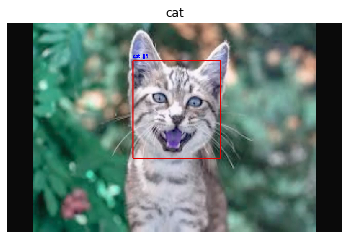

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_30.jpg [[6.1902552e-05 9.8563142e-08 6.4005204e-03 9.6401912e-01 5.1872307e-03
  2.3268964e-02 1.2539122e-04 8.5720170e-04 3.8397553e-05 4.1290685e-05]]


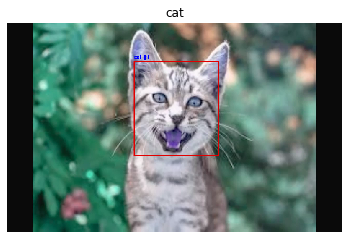

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_60.jpg [[6.1841092e-05 9.9073027e-08 6.4098537e-03 9.6403241e-01 5.1950724e-03
  2.3238039e-02 1.2539787e-04 8.5722416e-04 3.8655679e-05 4.1481144e-05]]


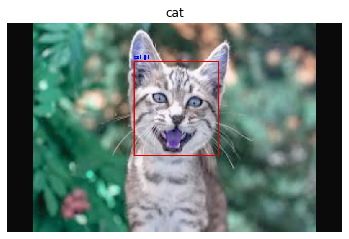

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_90.jpg [[9.99605238e-01 3.62619880e-06 1.00264697e-04 1.21693534e-04
  7.36980701e-06 2.24071277e-06 6.85913756e-06 4.64116465e-06
  2.10292023e-06 1.45995335e-04]]


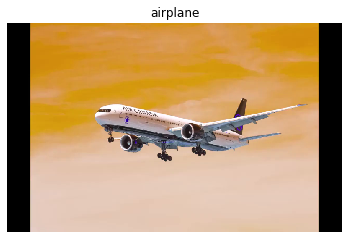

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_120.jpg [[9.99600828e-01 3.60300783e-06 1.01630416e-04 1.22354904e-04
  7.61444835e-06 2.23561005e-06 6.87204511e-06 4.68778944e-06
  2.13453836e-06 1.48035193e-04]]


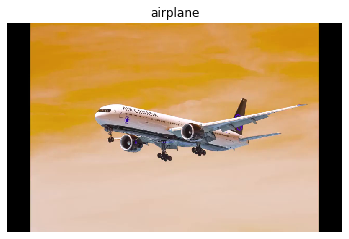

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_150.jpg [[9.99600828e-01 3.60300783e-06 1.01630416e-04 1.22354904e-04
  7.61444835e-06 2.23561005e-06 6.87204511e-06 4.68778944e-06
  2.13453836e-06 1.48035193e-04]]


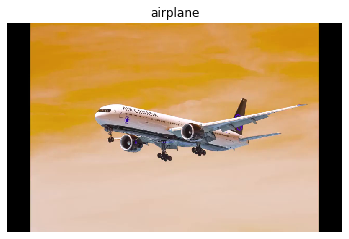

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_180.jpg [[9.7935450e-01 3.4680474e-03 9.7643360e-03 1.3767346e-04 9.1218590e-07
  2.5146373e-06 1.5773558e-05 3.0397412e-06 5.9416401e-03 1.3115300e-03]]


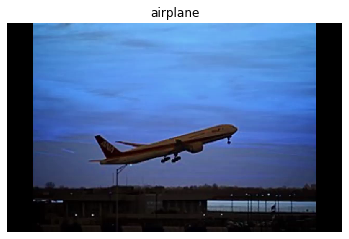

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_210.jpg [[9.7923422e-01 3.4924746e-03 9.7681284e-03 1.3904416e-04 9.1628306e-07
  2.5386612e-06 1.5614300e-05 3.0569870e-06 6.0121296e-03 1.3319914e-03]]


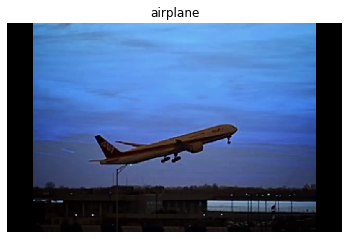

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_240.jpg [[9.7921741e-01 3.5081990e-03 9.7611351e-03 1.3955656e-04 9.1181994e-07
  2.5439324e-06 1.5573523e-05 3.0341898e-06 6.0206270e-03 1.3309254e-03]]


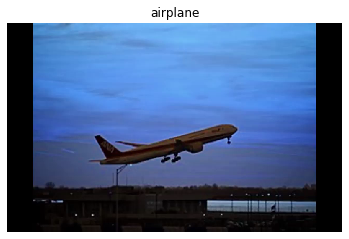

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_270.jpg [[9.9977869e-01 6.4239867e-07 2.0740999e-04 1.9979454e-06 7.8401745e-06
  2.2312436e-07 3.5336700e-07 3.5626553e-07 1.8566028e-06 6.0469210e-07]]


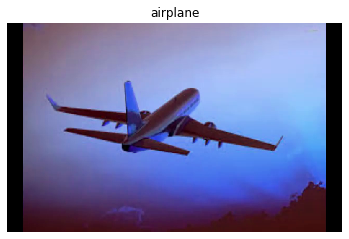

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_300.jpg [[9.9978036e-01 6.3478603e-07 2.0600991e-04 1.9851552e-06 7.7677660e-06
  2.2256155e-07 3.5192380e-07 3.5370877e-07 1.8366916e-06 6.0013502e-07]]


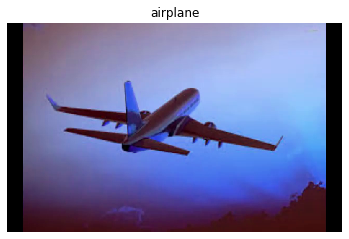

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_330.jpg [[9.9977833e-01 6.3448334e-07 2.0794646e-04 2.0060074e-06 7.7709365e-06
  2.2300006e-07 3.5826400e-07 3.4595163e-07 1.7501848e-06 5.9364112e-07]]


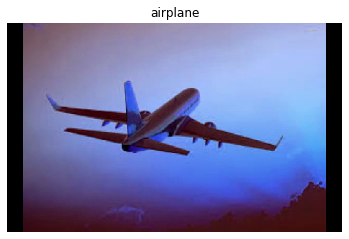

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_360.jpg [[7.0718217e-01 1.5526320e-01 1.4247858e-03 4.8092533e-02 2.8320619e-06
  1.8907135e-04 6.5365393e-06 4.0830137e-06 5.4973189e-02 3.2861613e-02]]


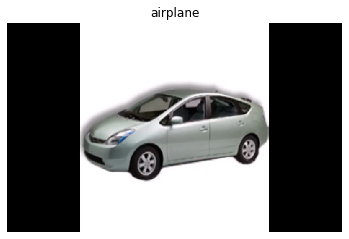

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_390.jpg [[7.0725590e-01 1.5520498e-01 1.4265878e-03 4.8153576e-02 2.8364955e-06
  1.8926027e-04 6.5326899e-06 4.0874916e-06 5.4919947e-02 3.2836217e-02]]


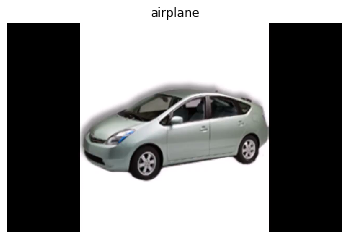

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_420.jpg [[7.0725590e-01 1.5520498e-01 1.4265878e-03 4.8153576e-02 2.8364955e-06
  1.8926027e-04 6.5326899e-06 4.0874916e-06 5.4919947e-02 3.2836217e-02]]


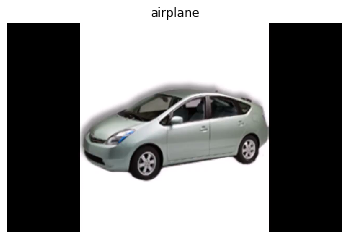

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_450.jpg [[7.8156509e-06 9.9983585e-01 7.2310975e-09 4.9837723e-05 1.6507219e-08
  2.2665922e-07 3.4683424e-08 3.9352571e-07 3.3895337e-06 1.0248062e-04]]


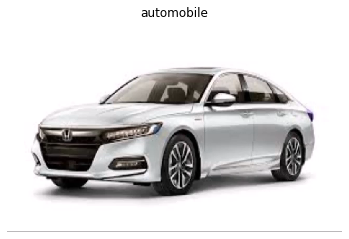

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_480.jpg [[8.07671768e-06 9.99831438e-01 7.61472041e-09 5.08492594e-05
  1.69001169e-08 2.42089584e-07 3.56150309e-08 4.14346800e-07
  3.32816217e-06 1.05660954e-04]]


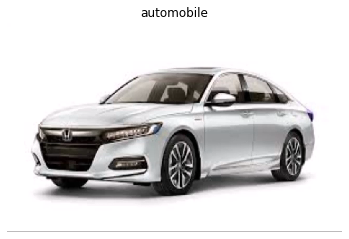

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_510.jpg [[8.20309833e-06 9.99830127e-01 7.68108155e-09 5.12064798e-05
  1.70464567e-08 2.44524927e-07 3.61012589e-08 4.17683651e-07
  3.37084634e-06 1.06381325e-04]]


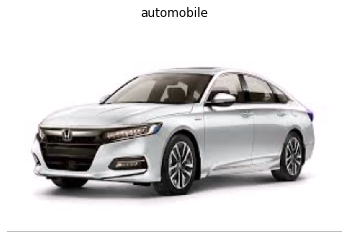

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_540.jpg [[3.39749344e-02 2.51586425e-05 8.40976119e-01 6.56551942e-02
  4.96974252e-02 3.65791400e-03 1.05104817e-03 3.76178231e-03
  1.07974862e-03 1.20696655e-04]]


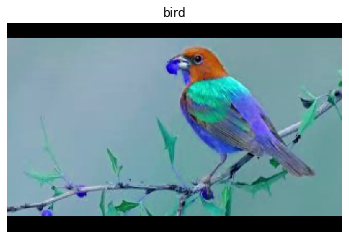

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_570.jpg [[3.3955306e-02 2.5079555e-05 8.4441543e-01 6.3921146e-02 4.8258923e-02
  3.5698900e-03 1.0405601e-03 3.6476378e-03 1.0480974e-03 1.1795927e-04]]


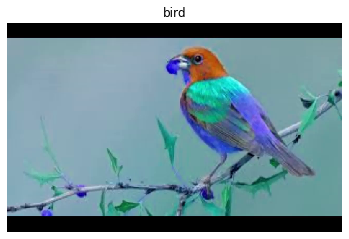

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_600.jpg [[3.3955306e-02 2.5079555e-05 8.4441543e-01 6.3921146e-02 4.8258923e-02
  3.5698900e-03 1.0405601e-03 3.6476378e-03 1.0480974e-03 1.1795927e-04]]


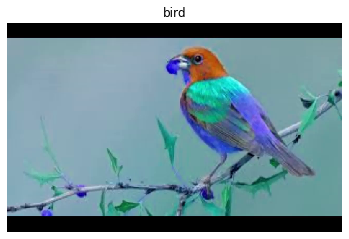

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_630.jpg [[9.0572141e-02 6.6261337e-04 8.0227858e-01 6.3843228e-02 1.1399258e-02
  4.2301528e-03 5.3815325e-03 6.0836138e-04 1.8520227e-02 2.5039066e-03]]


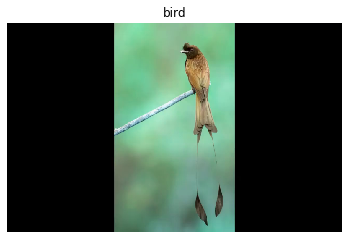

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_660.jpg [[9.2475973e-02 6.5567199e-04 8.0160660e-01 6.2779196e-02 1.1284139e-02
  4.1136476e-03 5.4391185e-03 6.0008932e-04 1.8516967e-02 2.5285170e-03]]


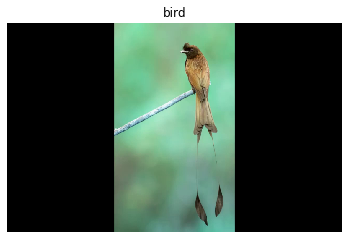

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_690.jpg [[9.2475973e-02 6.5567199e-04 8.0160660e-01 6.2779196e-02 1.1284139e-02
  4.1136476e-03 5.4391185e-03 6.0008932e-04 1.8516967e-02 2.5285170e-03]]


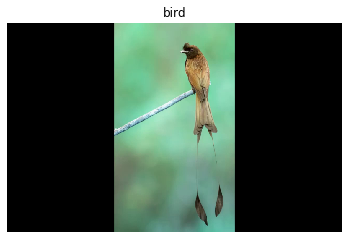

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_720.jpg [[5.1572995e-04 9.6507092e-06 4.9801998e-02 3.8421581e-07 3.4440600e-10
  1.3326540e-07 9.4967097e-01 7.0773076e-08 2.0541098e-08 9.6792678e-07]]


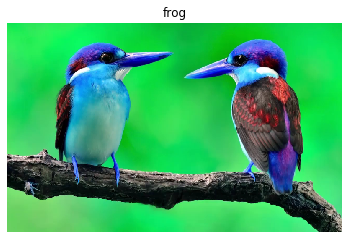

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_750.jpg [[5.1564886e-04 9.6309386e-06 4.9670253e-02 3.8398969e-07 3.4447684e-10
  1.3315078e-07 9.4980294e-01 7.0776835e-08 2.0503553e-08 9.6541623e-07]]


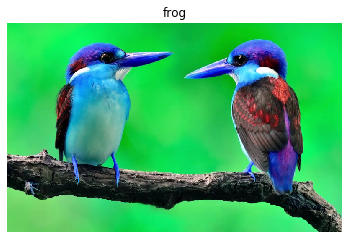

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_780.jpg [[5.1564886e-04 9.6309386e-06 4.9670253e-02 3.8398969e-07 3.4447684e-10
  1.3315078e-07 9.4980294e-01 7.0776835e-08 2.0503553e-08 9.6541623e-07]]


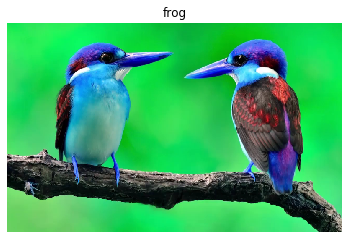

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_810.jpg [[9.6621145e-05 3.6524557e-09 2.2957772e-06 9.9151587e-01 1.8297094e-06
  8.3470754e-03 2.9878782e-09 3.6245714e-05 1.1759637e-08 3.6950318e-08]]


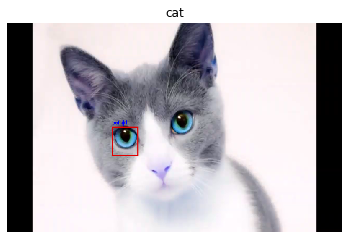

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_840.jpg [[9.6984579e-05 3.6871728e-09 2.4875760e-06 9.9129444e-01 1.9238782e-06
  8.5707931e-03 2.8780047e-09 3.3430111e-05 1.1521695e-08 3.5036607e-08]]


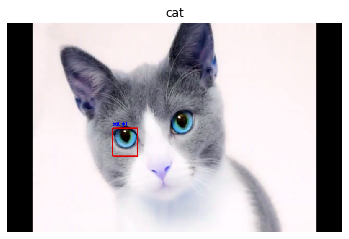

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_870.jpg [[9.6984579e-05 3.6871728e-09 2.4875760e-06 9.9129444e-01 1.9238782e-06
  8.5707931e-03 2.8780047e-09 3.3430111e-05 1.1521695e-08 3.5036607e-08]]


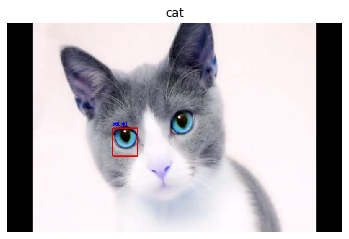

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_900.jpg [[1.3639231e-01 4.6346571e-07 2.7558208e-05 7.9074848e-01 1.1572200e-05
  1.7657939e-02 1.2362574e-06 5.4970004e-02 2.4471727e-05 1.6596443e-04]]


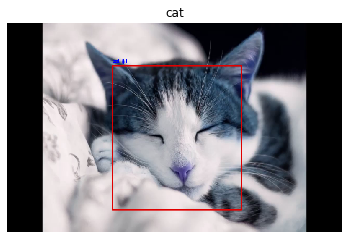

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_930.jpg [[1.3636692e-01 4.6253973e-07 2.7517133e-05 7.9071677e-01 1.1572519e-05
  1.7682882e-02 1.2358978e-06 5.5002917e-02 2.4463254e-05 1.6525245e-04]]


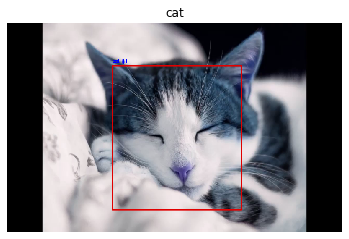

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_960.jpg [[1.3131440e-01 5.0595708e-07 2.7615339e-05 7.9345703e-01 1.1624801e-05
  1.8303499e-02 1.3222044e-06 5.6683149e-02 2.4319814e-05 1.7658764e-04]]


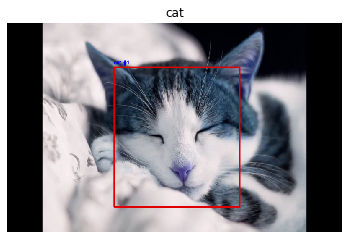

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_990.jpg [[2.4834373e-03 3.3567994e-06 8.7316847e-01 4.2950995e-03 9.2201002e-02
  4.4612138e-05 4.0327429e-04 4.5176983e-04 5.8158180e-03 2.1133257e-02]]


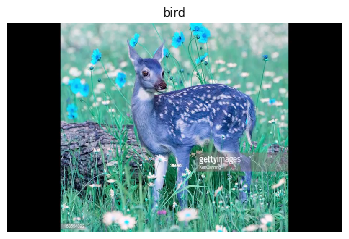

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1020.jpg [[2.4919610e-03 3.3559375e-06 8.7302005e-01 4.3104514e-03 9.2391372e-02
  4.4472625e-05 4.0167899e-04 4.4732355e-04 5.8225151e-03 2.1066727e-02]]


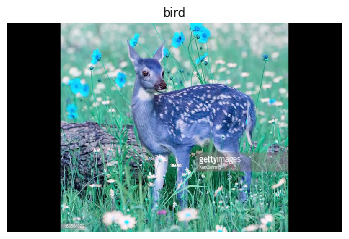

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1050.jpg [[2.4861125e-03 3.3662243e-06 8.7311101e-01 4.3201689e-03 9.2169419e-02
  4.4418255e-05 4.0118751e-04 4.4802294e-04 5.8424850e-03 2.1173799e-02]]


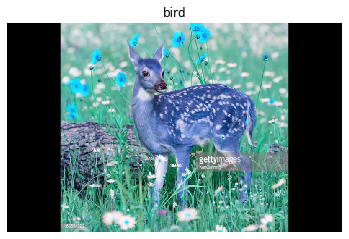

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1080.jpg [[4.1301805e-03 6.3536856e-07 4.7403942e-03 3.6184661e-04 9.9042213e-01
  1.2337820e-06 3.0880916e-04 1.4248672e-06 1.7059341e-05 1.6261098e-05]]


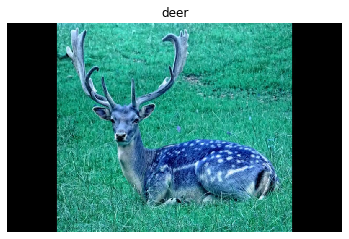

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1110.jpg [[4.1590980e-03 6.3667028e-07 4.7606886e-03 3.6533279e-04 9.9036741e-01
  1.2352784e-06 3.1105170e-04 1.4180107e-06 1.6993999e-05 1.6190506e-05]]


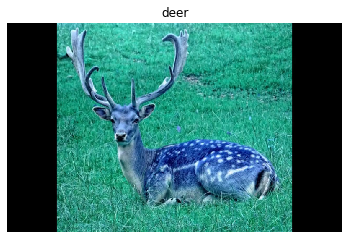

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1140.jpg [[4.8771449e-03 6.6621192e-07 5.5147493e-03 4.1640949e-04 9.8881698e-01
  1.4196766e-06 3.3543503e-04 1.5700186e-06 1.8094905e-05 1.7454502e-05]]


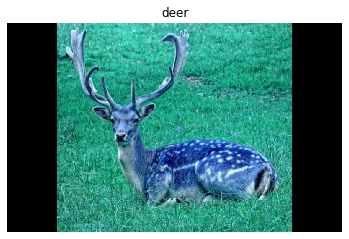

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1170.jpg [[9.6940738e-01 1.7752113e-06 1.3774089e-02 1.2450262e-02 1.5264676e-03
  6.8102754e-04 3.2121192e-05 3.8100377e-04 1.6683512e-03 7.7479024e-05]]


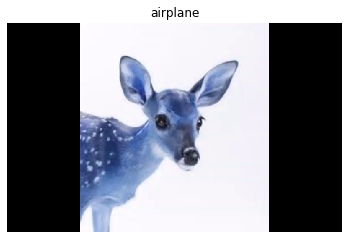

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1200.jpg [[9.6940738e-01 1.7752113e-06 1.3774089e-02 1.2450262e-02 1.5264676e-03
  6.8102754e-04 3.2121192e-05 3.8100377e-04 1.6683512e-03 7.7479024e-05]]


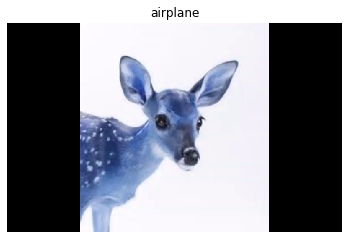

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1230.jpg [[9.6940738e-01 1.7752113e-06 1.3774089e-02 1.2450262e-02 1.5264676e-03
  6.8102754e-04 3.2121192e-05 3.8100377e-04 1.6683512e-03 7.7479024e-05]]


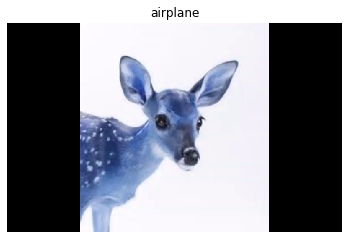

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1260.jpg [[5.2526313e-05 8.0701068e-07 6.2611690e-03 2.1007602e-01 1.5268379e-04
  7.8238612e-01 6.8957638e-06 1.0497092e-03 6.6099625e-07 1.3443587e-05]]


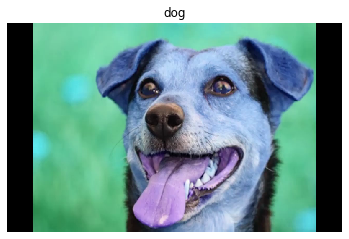

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1290.jpg [[4.90562452e-05 8.17915634e-07 7.01978616e-03 2.16399491e-01
  1.60835887e-04 7.75276721e-01 6.98861095e-06 1.07254146e-03
  6.46648800e-07 1.31265715e-05]]


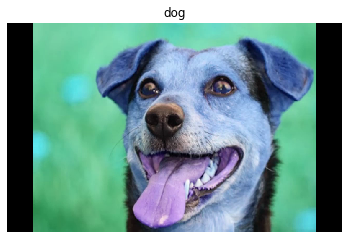

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1320.jpg [[4.9092108e-05 8.1837777e-07 7.0796874e-03 2.1664147e-01 1.6110750e-04
  7.7497315e-01 6.9635385e-06 1.0738589e-03 6.5328697e-07 1.3125000e-05]]


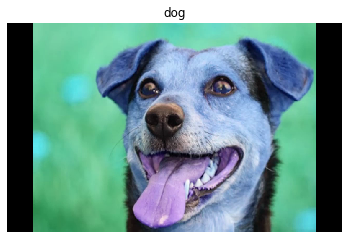

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1350.jpg [[4.9092108e-05 8.1837777e-07 7.0796874e-03 2.1664147e-01 1.6110750e-04
  7.7497315e-01 6.9635385e-06 1.0738589e-03 6.5328697e-07 1.3125000e-05]]


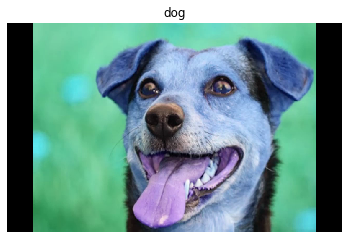

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1380.jpg [[4.9092108e-05 8.1837777e-07 7.0796874e-03 2.1664147e-01 1.6110750e-04
  7.7497315e-01 6.9635385e-06 1.0738589e-03 6.5328697e-07 1.3125000e-05]]


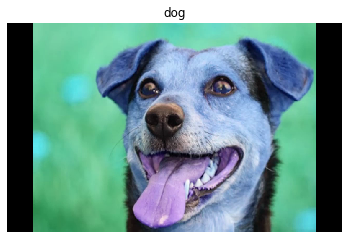

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1410.jpg [[4.9092108e-05 8.1837777e-07 7.0796874e-03 2.1664147e-01 1.6110750e-04
  7.7497315e-01 6.9635385e-06 1.0738589e-03 6.5328697e-07 1.3125000e-05]]


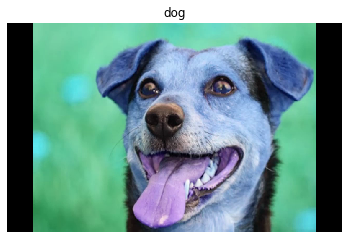

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1440.jpg [[1.5177125e-03 2.2775882e-06 9.0999376e-05 1.4008842e-01 1.6976141e-03
  2.5965707e-02 8.4600636e-08 8.3054531e-01 8.1145690e-06 8.3783714e-05]]


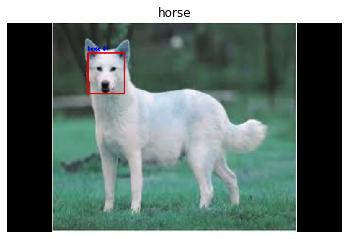

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1470.jpg [[1.5110159e-03 2.2818072e-06 8.9929563e-05 1.4009397e-01 1.6897217e-03
  2.6143195e-02 8.3987317e-08 8.3037794e-01 8.0961772e-06 8.3742074e-05]]


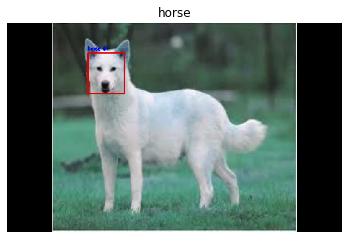

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1500.jpg [[1.5110159e-03 2.2818072e-06 8.9929563e-05 1.4009397e-01 1.6897217e-03
  2.6143195e-02 8.3987317e-08 8.3037794e-01 8.0961772e-06 8.3742074e-05]]


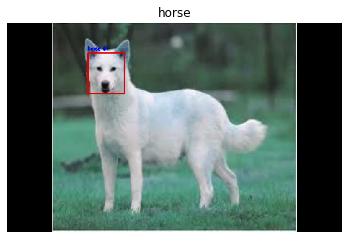

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1530.jpg [[1.1805113e-03 1.7311722e-05 5.9170048e-03 6.4638216e-04 5.1531817e-05
  7.2238057e-05 9.9209577e-01 1.1752649e-05 2.2381590e-07 7.2863072e-06]]


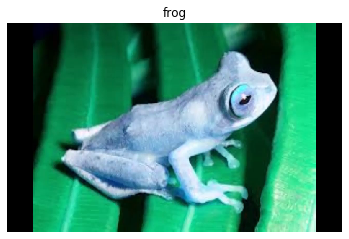

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1560.jpg [[1.1785344e-03 1.7209466e-05 5.8653369e-03 6.3987810e-04 5.1064471e-05
  7.1666531e-05 9.9215722e-01 1.1641177e-05 2.2296948e-07 7.2288944e-06]]


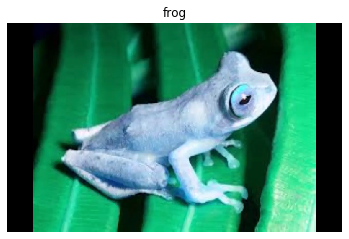

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1590.jpg [[1.1760016e-03 1.7111359e-05 5.8380454e-03 6.3795573e-04 5.0889797e-05
  7.1456816e-05 9.9218953e-01 1.1576004e-05 2.2209747e-07 7.1922232e-06]]


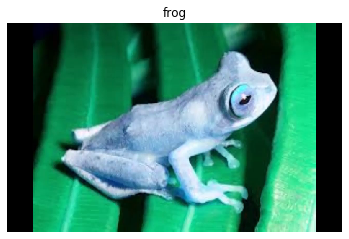

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1620.jpg [[9.2971595e-06 2.5552831e-06 1.0880501e-02 2.0276222e-04 1.5756418e-04
  2.4935947e-04 9.8849338e-01 4.3018567e-06 1.2718239e-08 2.4934883e-07]]


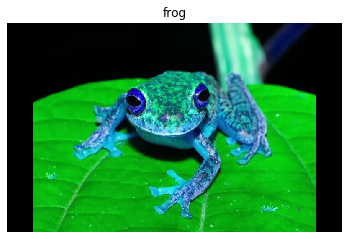

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1650.jpg [[9.3131430e-06 2.5554027e-06 1.0905174e-02 2.0309063e-04 1.5773017e-04
  2.4964235e-04 9.8846799e-01 4.3078712e-06 1.2751335e-08 2.4951348e-07]]


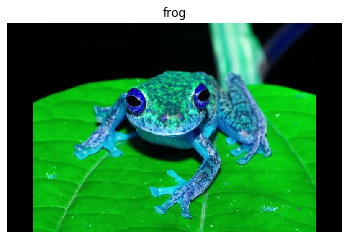

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1680.jpg [[9.3131430e-06 2.5554027e-06 1.0905174e-02 2.0309063e-04 1.5773017e-04
  2.4964235e-04 9.8846799e-01 4.3078712e-06 1.2751335e-08 2.4951348e-07]]


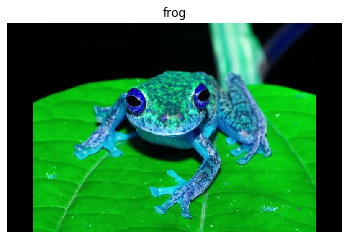

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1710.jpg [[1.3392413e-02 5.0506851e-06 2.1264665e-03 7.2459675e-02 1.7392191e-06
  1.7080400e-02 1.0092108e-01 7.9395986e-01 1.4483861e-06 5.1912568e-05]]


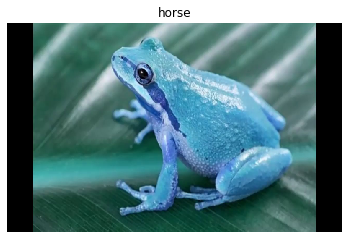

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1740.jpg [[1.3593663e-02 5.0318167e-06 2.1301596e-03 7.1994402e-02 1.7211044e-06
  1.7063662e-02 1.0004216e-01 7.9511571e-01 1.4489517e-06 5.2144951e-05]]


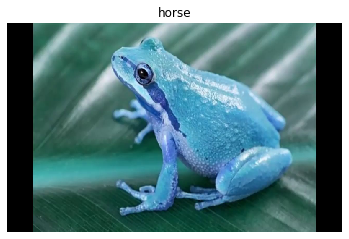

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1770.jpg [[1.1796578e-02 5.0061108e-06 1.8657030e-03 6.8582088e-02 1.6426252e-06
  1.5390257e-02 8.9647762e-02 8.1265461e-01 1.3468868e-06 5.5080480e-05]]


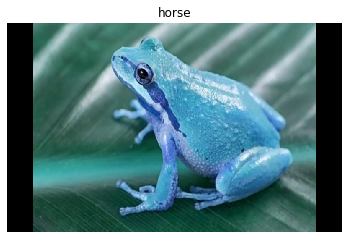

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1800.jpg [[1.5970942e-07 4.0970716e-10 3.1416125e-08 4.2421257e-06 3.8885801e-09
  4.1989479e-05 4.8963211e-09 9.9995339e-01 9.4117408e-11 6.4431831e-08]]


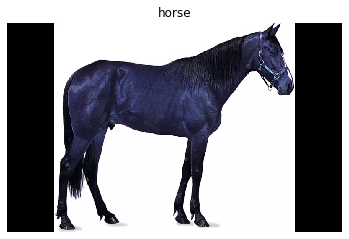

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1830.jpg [[1.5963404e-07 4.0965792e-10 3.1408636e-08 4.2403217e-06 3.8862886e-09
  4.1977746e-05 4.8942859e-09 9.9995339e-01 9.4080077e-11 6.4414749e-08]]


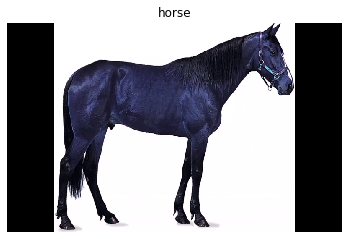

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1860.jpg [[1.5963404e-07 4.0965792e-10 3.1408636e-08 4.2403217e-06 3.8862886e-09
  4.1977746e-05 4.8942859e-09 9.9995339e-01 9.4080077e-11 6.4414749e-08]]


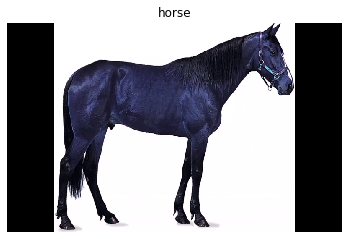

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1890.jpg [[3.4361319e-06 3.5839939e-08 1.2891949e-06 9.2179161e-03 1.2447838e-04
  2.3545129e-03 4.8126972e-06 9.8829329e-01 2.3864985e-08 2.0216868e-07]]


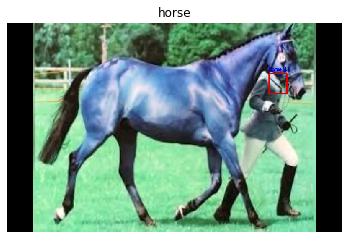

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1920.jpg [[3.6873535e-06 3.6080724e-08 1.4898766e-06 8.7526636e-03 1.3898518e-04
  2.2770877e-03 5.3548797e-06 9.8882049e-01 2.4963851e-08 2.1070272e-07]]


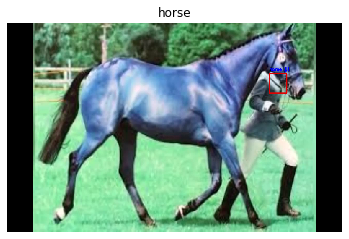

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1950.jpg [[3.7468658e-06 3.6929961e-08 1.5035773e-06 8.8420650e-03 1.4090829e-04
  2.2927332e-03 5.3996864e-06 9.8871338e-01 2.5541924e-08 2.1396804e-07]]


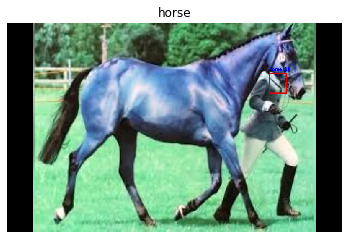

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_1980.jpg [[9.9472332e-01 2.4973173e-05 1.9754154e-04 3.0938988e-03 5.6862750e-06
  2.7211083e-05 1.9163472e-05 1.3898473e-03 7.7384866e-05 4.4101843e-04]]


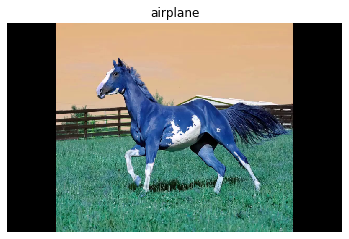

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2010.jpg [[9.9475867e-01 2.4916633e-05 1.9699377e-04 3.0740541e-03 5.6572899e-06
  2.6997966e-05 1.9109511e-05 1.3764006e-03 7.7473720e-05 4.3962273e-04]]


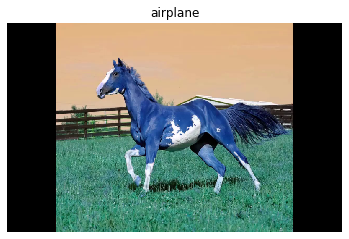

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2040.jpg [[9.9477518e-01 2.4915169e-05 1.9634939e-04 3.0641216e-03 5.6333020e-06
  2.6880643e-05 1.9089573e-05 1.3711456e-03 7.7507451e-05 4.3902209e-04]]


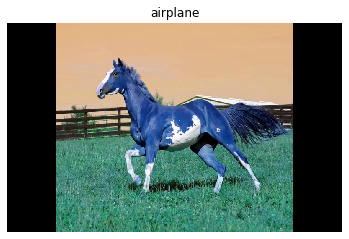

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2070.jpg [[3.33785010e-03 9.76345385e-04 5.44027607e-05 1.01987995e-01
  1.18103098e-05 1.04889320e-03 6.42093391e-06 6.71051239e-05
  8.87130260e-01 5.37881861e-03]]


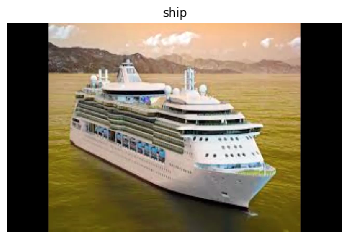

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2100.jpg [[3.33981332e-03 9.76940151e-04 5.44328359e-05 1.02023505e-01
  1.18149592e-05 1.04955619e-03 6.42825898e-06 6.71015150e-05
  8.87090981e-01 5.37950872e-03]]


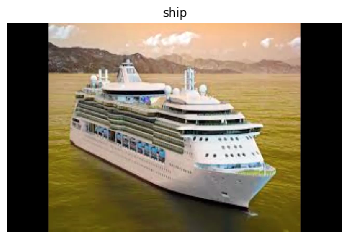

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2130.jpg [[3.33981332e-03 9.76940151e-04 5.44328359e-05 1.02023505e-01
  1.18149592e-05 1.04955619e-03 6.42825898e-06 6.71015150e-05
  8.87090981e-01 5.37950872e-03]]


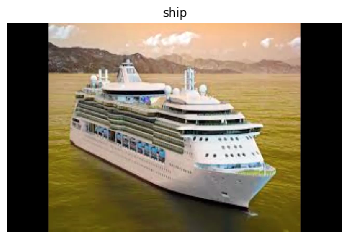

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2160.jpg [[1.16337985e-01 3.17615718e-02 1.24730670e-03 2.29650028e-02
  1.27731008e-04 3.16054997e-04 5.06442339e-05 2.38695648e-05
  7.93302715e-01 3.38671692e-02]]


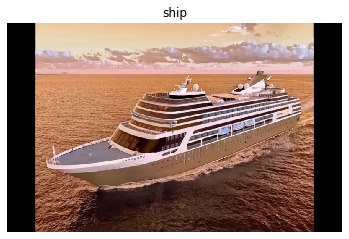

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2190.jpg [[1.08632594e-01 2.99876705e-02 1.08096725e-03 2.08529029e-02
  1.09311230e-04 2.61852663e-04 4.33201640e-05 2.19814538e-05
  8.06805015e-01 3.22043672e-02]]


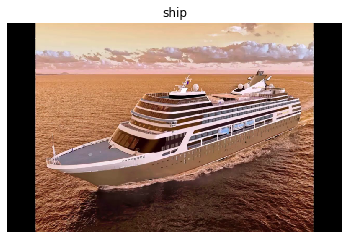

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2220.jpg [[1.0781627e-01 2.9821992e-02 1.0753670e-03 2.0599158e-02 1.0812228e-04
  2.5971865e-04 4.3196498e-05 2.1737867e-05 8.0824775e-01 3.2006726e-02]]


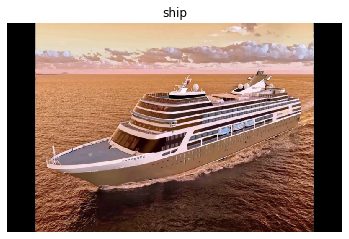

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2250.jpg [[2.9568986e-05 4.9458208e-06 2.7722116e-08 3.3457036e-05 1.3818841e-08
  3.5667210e-07 2.3446358e-09 2.5152699e-08 9.9987209e-01 5.9483318e-05]]


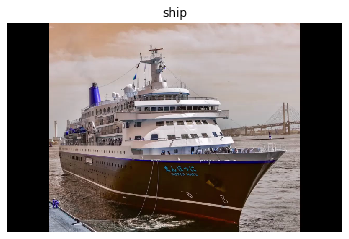

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2280.jpg [[2.9611228e-05 4.9538871e-06 2.7798780e-08 3.3566914e-05 1.3890585e-08
  3.5757390e-07 2.3399311e-09 2.5144445e-08 9.9987197e-01 5.9532573e-05]]


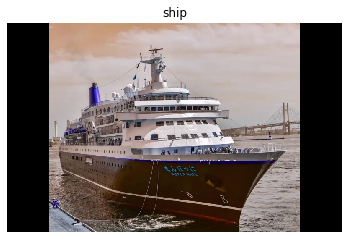

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2310.jpg [[3.1124109e-05 5.4621096e-06 2.7830788e-08 3.5724792e-05 1.3422328e-08
  3.7312049e-07 2.3705740e-09 2.5323263e-08 9.9986684e-01 6.0409817e-05]]


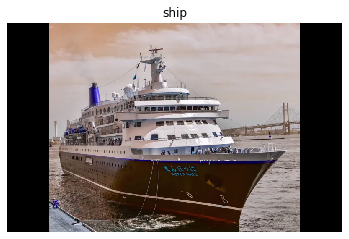

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2340.jpg [[1.05327335e-05 6.91265275e-04 1.53860223e-04 3.46164052e-06
  8.78409789e-09 9.67960386e-06 3.62090162e-07 3.76036064e-06
  3.49787183e-06 9.99123633e-01]]


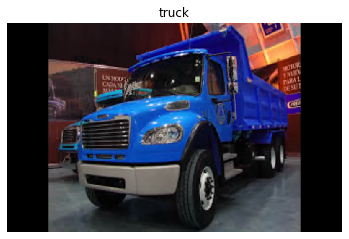

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2370.jpg [[1.06527705e-05 6.92579837e-04 1.55181711e-04 3.51634321e-06
  8.97400998e-09 9.86512077e-06 3.68578299e-07 3.85294197e-06
  3.54707345e-06 9.99120414e-01]]


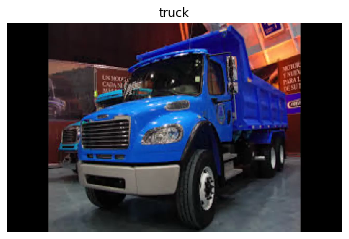

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2400.jpg [[1.06527705e-05 6.92579837e-04 1.55181711e-04 3.51634321e-06
  8.97400998e-09 9.86512077e-06 3.68578299e-07 3.85294197e-06
  3.54707345e-06 9.99120414e-01]]


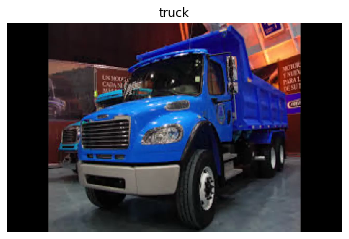

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2430.jpg [[2.63282360e-04 3.27267189e-05 1.56224417e-06 5.72601966e-05
  1.43555345e-08 1.04860305e-06 1.66480996e-09 6.04887100e-06
  6.07186579e-04 9.99030948e-01]]


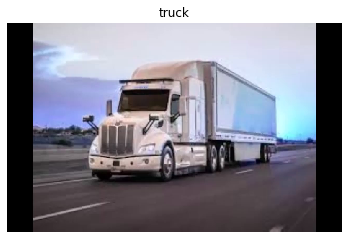

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2460.jpg [[2.6391158e-04 3.2758599e-05 1.5674674e-06 5.7372577e-05 1.4644118e-08
  1.0576481e-06 1.6617231e-09 6.0933603e-06 6.1206083e-04 9.9902523e-01]]


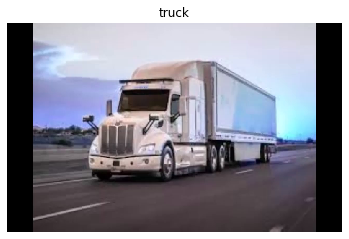

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2490.jpg [[2.3580002e-04 3.1607935e-05 1.5470721e-06 5.8224668e-05 1.5803996e-08
  1.0104175e-06 1.5002781e-09 6.1018195e-06 5.3871691e-04 9.9912697e-01]]


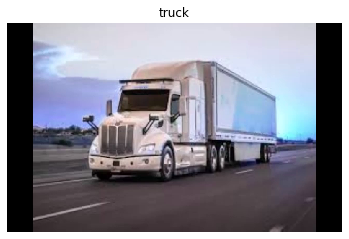

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2520.jpg [[4.3857349e-09 5.7230670e-07 5.0388088e-10 5.9900658e-06 1.7428645e-10
  3.0396922e-07 2.6934904e-11 2.1364725e-07 1.0044768e-09 9.9999297e-01]]


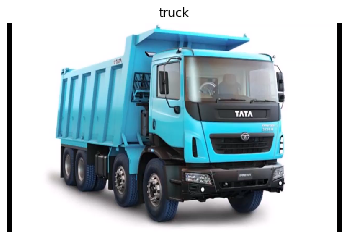

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2550.jpg [[4.3784216e-09 5.6993252e-07 5.0278354e-10 5.9801459e-06 1.7515088e-10
  3.0469772e-07 2.7114642e-11 2.1295808e-07 1.0082044e-09 9.9999297e-01]]


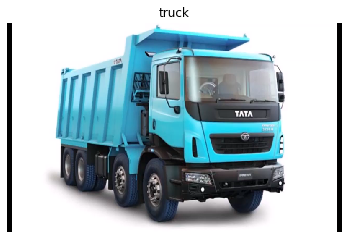

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2580.jpg [[4.3784216e-09 5.6993252e-07 5.0278354e-10 5.9801459e-06 1.7515088e-10
  3.0469772e-07 2.7114642e-11 2.1295808e-07 1.0082044e-09 9.9999297e-01]]


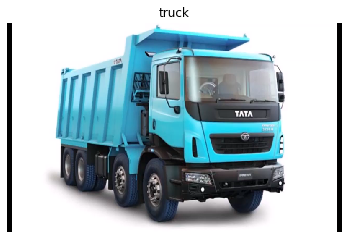

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2610.jpg [[1.5469922e-01 1.8278029e-02 4.6609128e-03 1.2589470e-01 6.3035930e-07
  1.2009394e-03 5.5073356e-06 2.8626394e-04 5.5645622e-02 6.3932812e-01]]


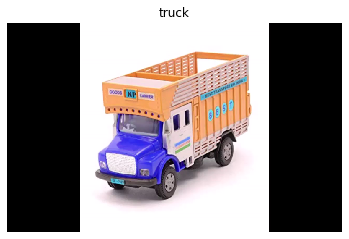

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2640.jpg [[1.5267467e-01 1.8169286e-02 4.7724396e-03 1.2653691e-01 6.0025724e-07
  1.1934257e-03 5.6156655e-06 2.5879664e-04 5.8447897e-02 6.3794035e-01]]


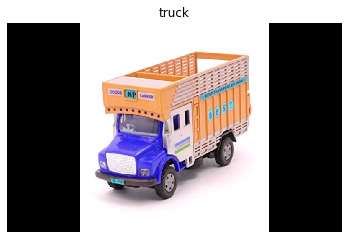

-------------------------------
frame (720, 1280, 3)
Orignal frame size (720, 1280, 3)
Resized image  (1, 32, 32, 3)
frame_2670.jpg [[1.5267467e-01 1.8169286e-02 4.7724396e-03 1.2653691e-01 6.0025724e-07
  1.1934257e-03 5.6156655e-06 2.5879664e-04 5.8447897e-02 6.3794035e-01]]


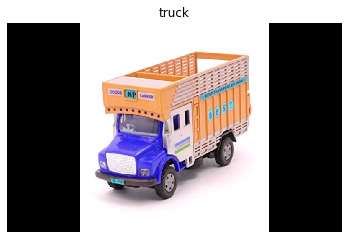

-------------------------------


In [0]:
do_video_face_recognition()

## References:


*  https://www.pyimagesearch.com/2016/06/20/detecting-cats-in-images-with-opencv/
*  https://github.com/opencv/opencv/tree/master/data/haarcascades



